# SExtractor config parameter study

Here, I am studying the influence of 4 SExtractor configuration parameters that may be important for our UDG search:
> * DETECT_THRESH: Detection threshold (relative to Background).
> * DETECT_MINAREA: Minimum number of pixels above threshold triggering detection.
> * DEBLEND_NTHRESH: Number of deblending sub-thresholds.
> * DEBLEND_MINCONT: Minimum contrast parameter for de-blending.

This notebook shows results for three regions in the HSC footprint that contain a UDG candidate. The images are SExtractor's aperture "check-image". The ellipses show the apertures used for the MAG_AUTO parameter. If two radii are visible, the Kron and Petrosian parameters are different, with Petrosian usually being associated with the outer radius.

In [1]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt
from sexpy.utils import read_cat
from imtools.cutout import get_cutout
from toolbox.image import zscale
from astropy.io import fits
import seaborn
seaborn.set(font_scale=1.6)
seaborn.set_style('white')
basedir = '../sexout/HSC-I/'
datdir = lambda t, p: basedir+t+'/'+p+'/' 

In [2]:
def make_images(files, t, p, coord, title=None, catfiles=None, contrast=0.05):
    fig, axes = plt.subplots(2, 3, figsize=(16,11))
    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    axes = axes.flatten()
    for i, f in enumerate(files):
        data = fits.getdata(datdir(t,p)+f)
        header = fits.getheader(datdir(t,p)+f)
        cutout = get_cutout(data, coord, header, size=600).data
        vmin, vmax = zscale(cutout, contrast=contrast)
        axes[i].imshow(cutout, vmin=vmin, vmax=vmax, cmap=plt.cm.gray, origin='lower', aspect='auto')
        val = f.split('_')[2]
        axes[i].text(0.5, 0.85, val, color='r', transform=axes[i].transAxes, fontsize=25)
        plt.setp(axes[i].get_xticklabels(), visible=False)
        plt.setp(axes[i].get_yticklabels(), visible=False)
        if catfiles is not None:
            cat = read_cat(datdir(t,p)+catfiles[i])
            axes[i].set_title(str(len(cat))+' objects in cat')
    if title is not None:
        plt.suptitle('Vary '+title, y=0.97, fontsize=25)

In [3]:
def get_files(apfiles, catfiles, param):
    paramfiles = filter(lambda f: param in f, apfiles)
    paramfiles.sort(key=lambda f: float(f.split('_')[2]))
    cats = filter(lambda f: param in f, catfiles)
    cats.sort(key=lambda f: float(f.split('_')[2][:-4]))
    return paramfiles, cats

# Region 1

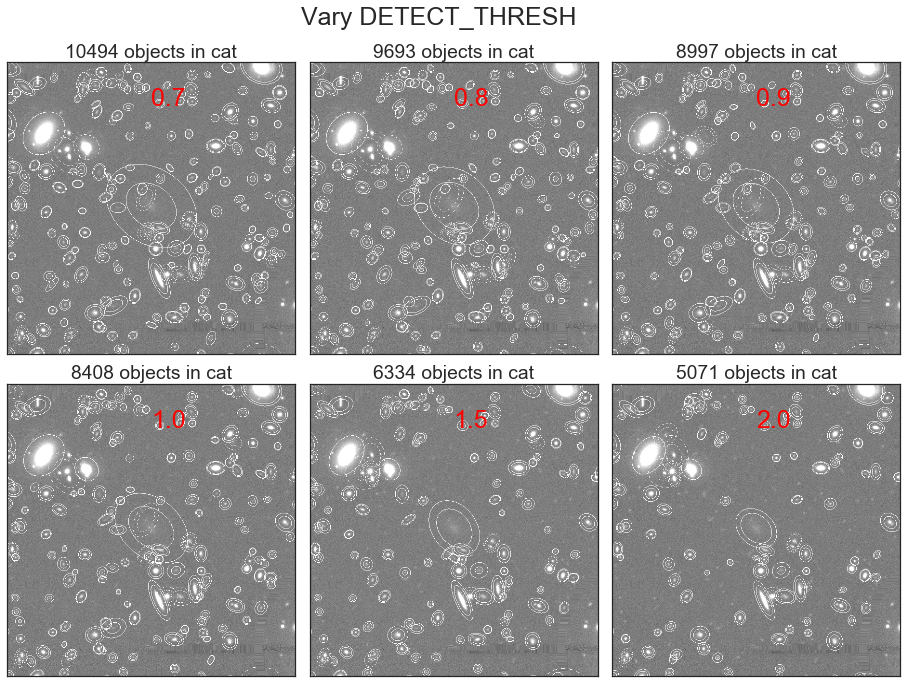

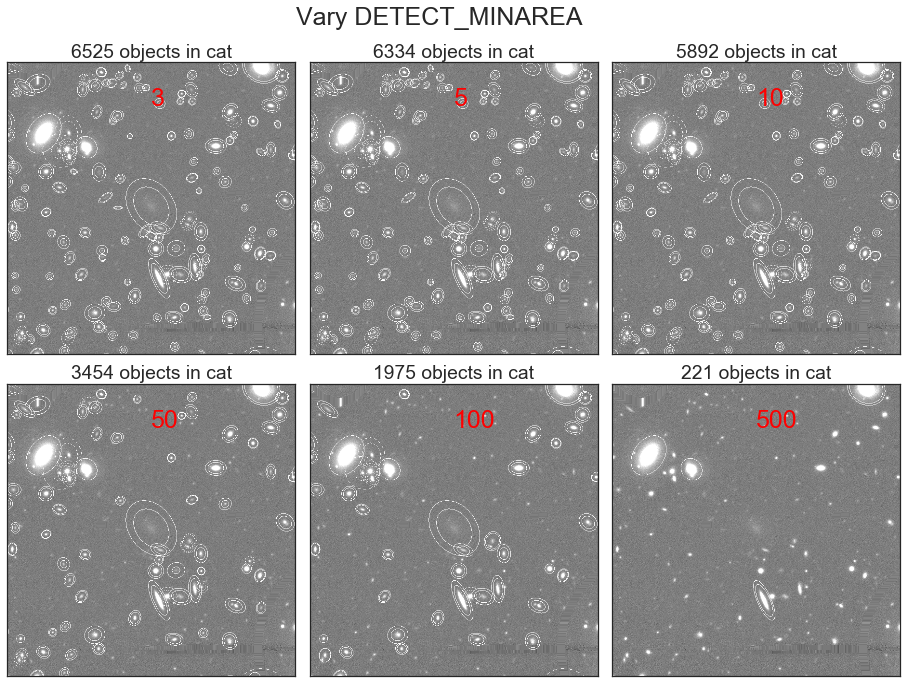

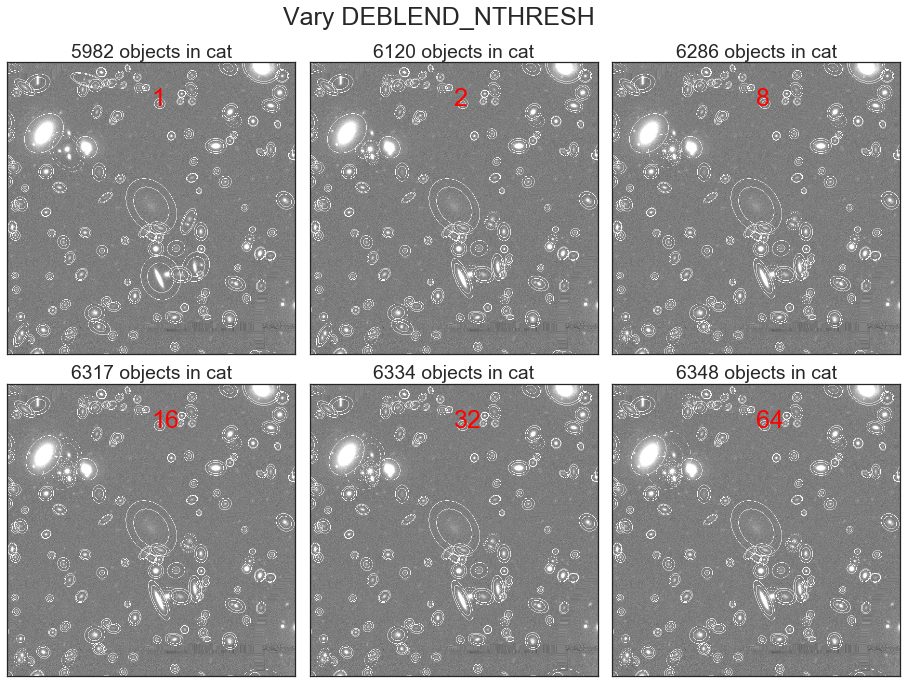

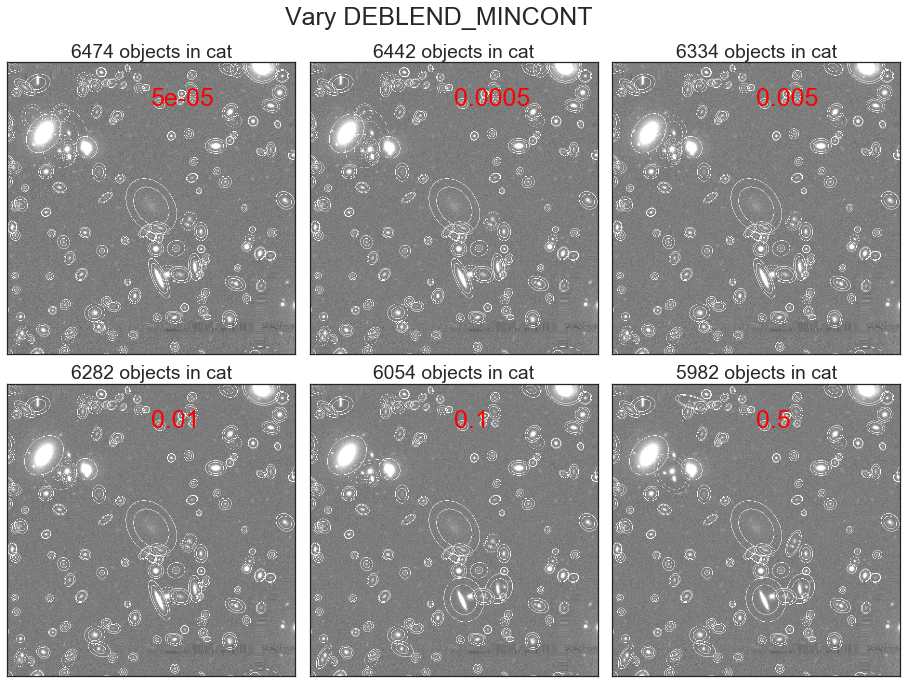

In [4]:
tract, patch = '9348', '8-6'
allfiles = os.listdir(datdir(tract, patch))
catfiles = filter(lambda f: 'cat' in f, allfiles)
apfiles = filter(lambda f: 'ap' in f, allfiles)
coord = (180.02026, -0.31117473)
params = ['DETECT_THRESH', 'DETECT_MINAREA', 'DEBLEND_NTHRESH', 'DEBLEND_MINCONT']
for param in params:
    paramfiles, cats = get_files(apfiles, catfiles, param)
    make_images(paramfiles, tract, patch, coord, param, cats)

# Region 2

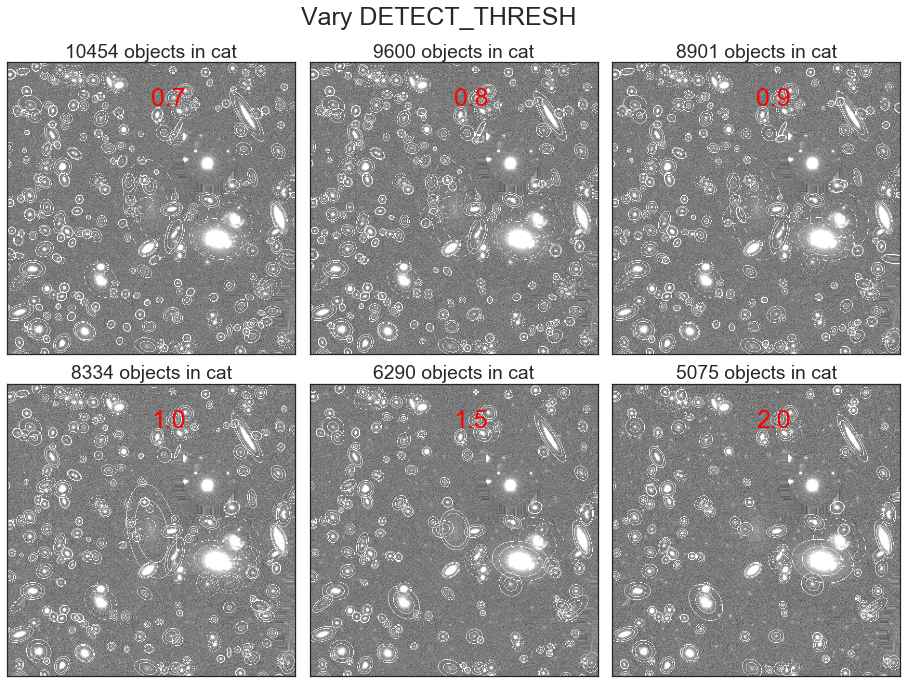

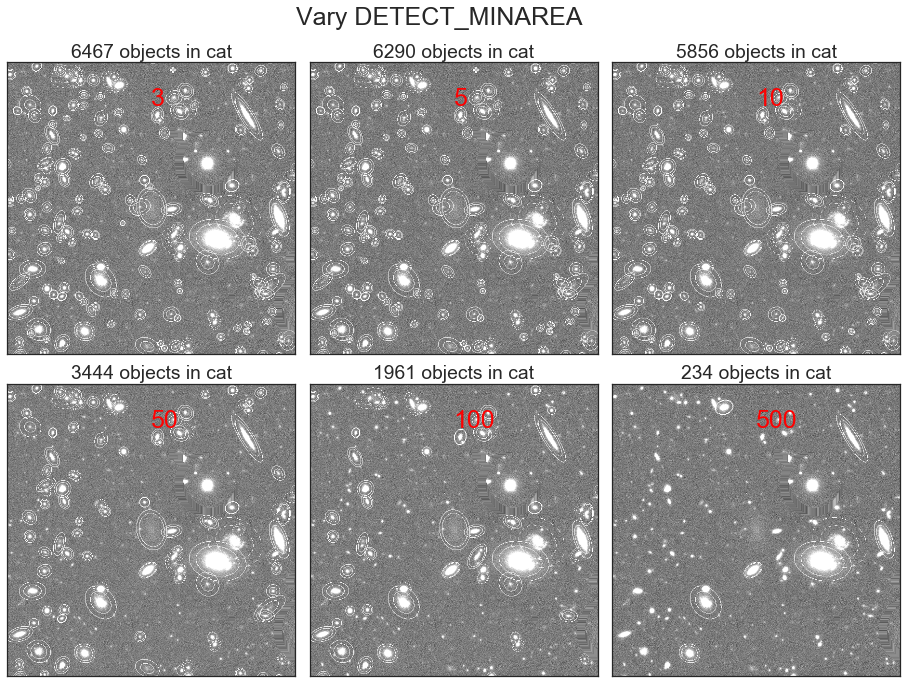

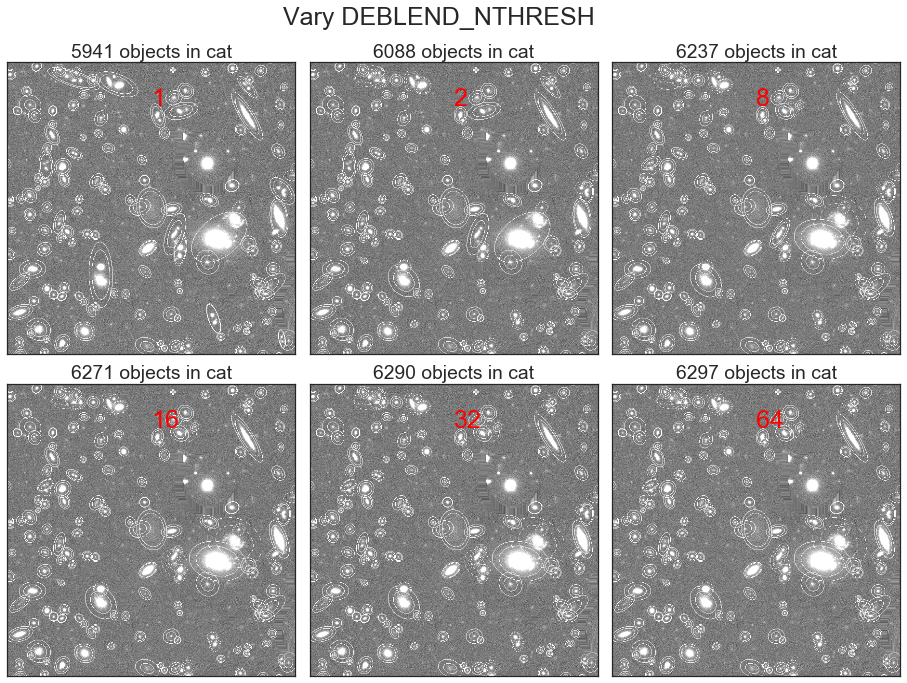

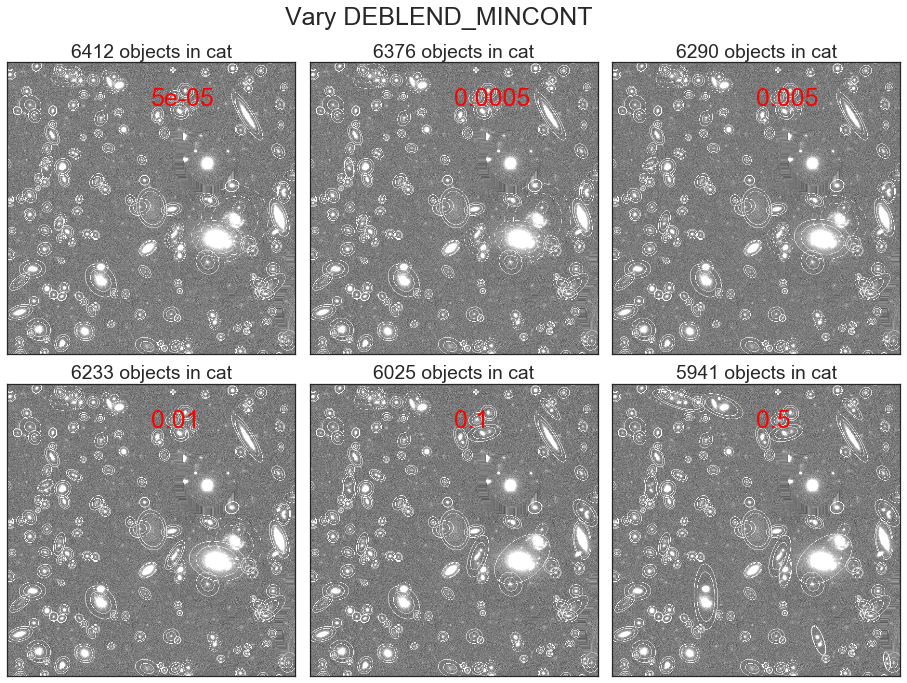

In [5]:
tract, patch = '9348', '7-6'
allfiles = os.listdir(datdir(tract, patch))
catfiles = filter(lambda f: 'cat' in f, allfiles)
apfiles = filter(lambda f: 'ap' in f, allfiles)
coord = (180.14344, -0.28861605)
params = ['DETECT_THRESH', 'DETECT_MINAREA', 'DEBLEND_NTHRESH', 'DEBLEND_MINCONT']
for param in params:
    paramfiles, cats = get_files(apfiles, catfiles, param)
    make_images(paramfiles, tract, patch, coord, param, cats, contrast=0.1)

# Region 3

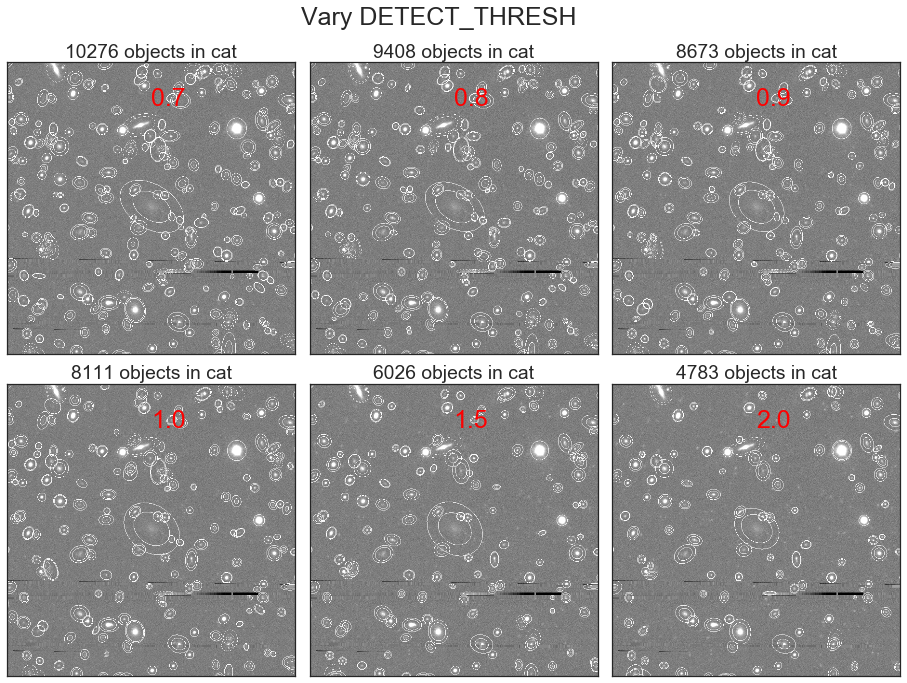

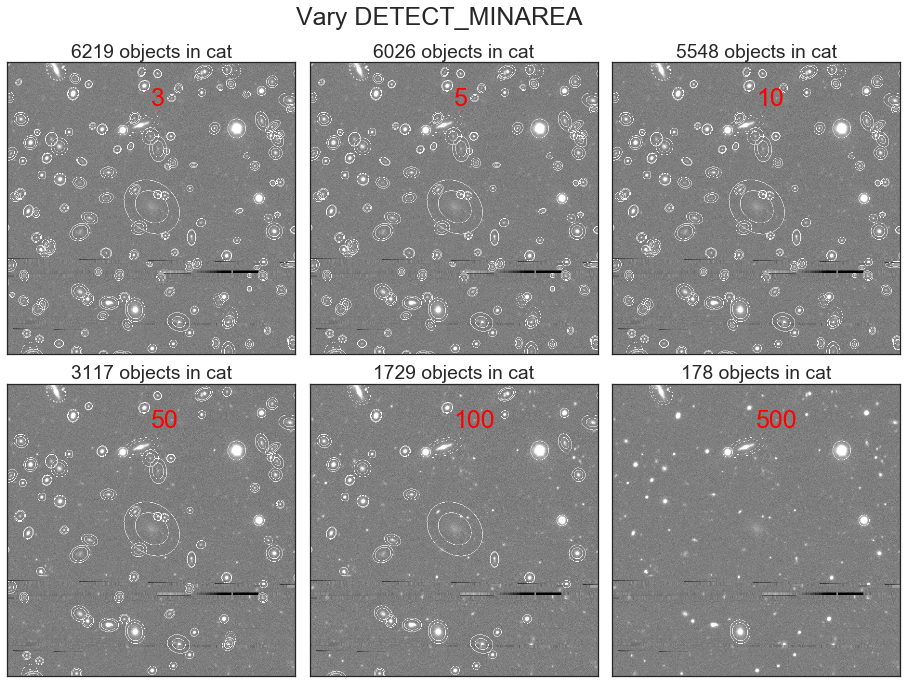

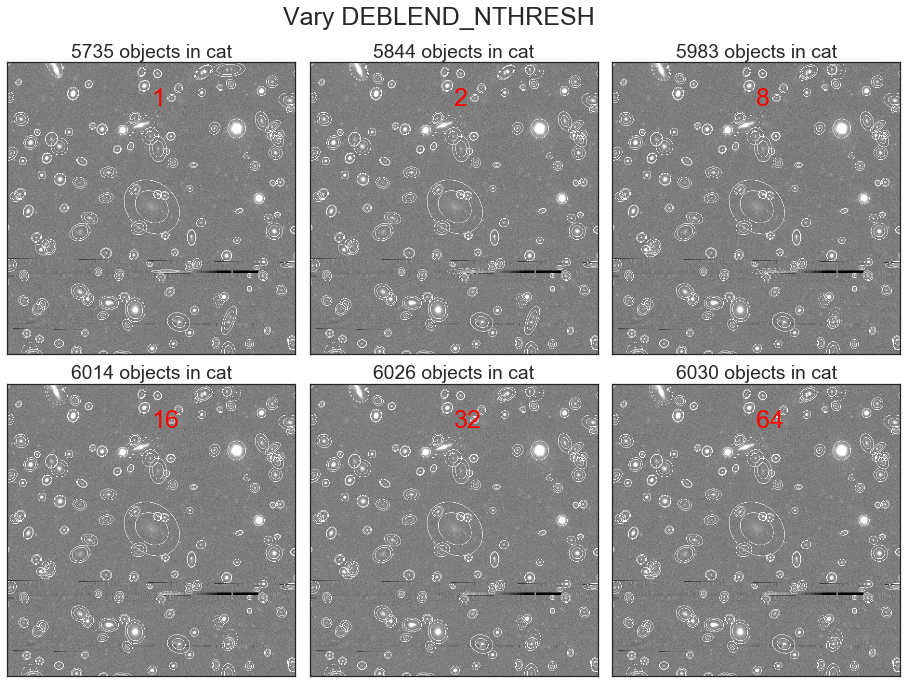

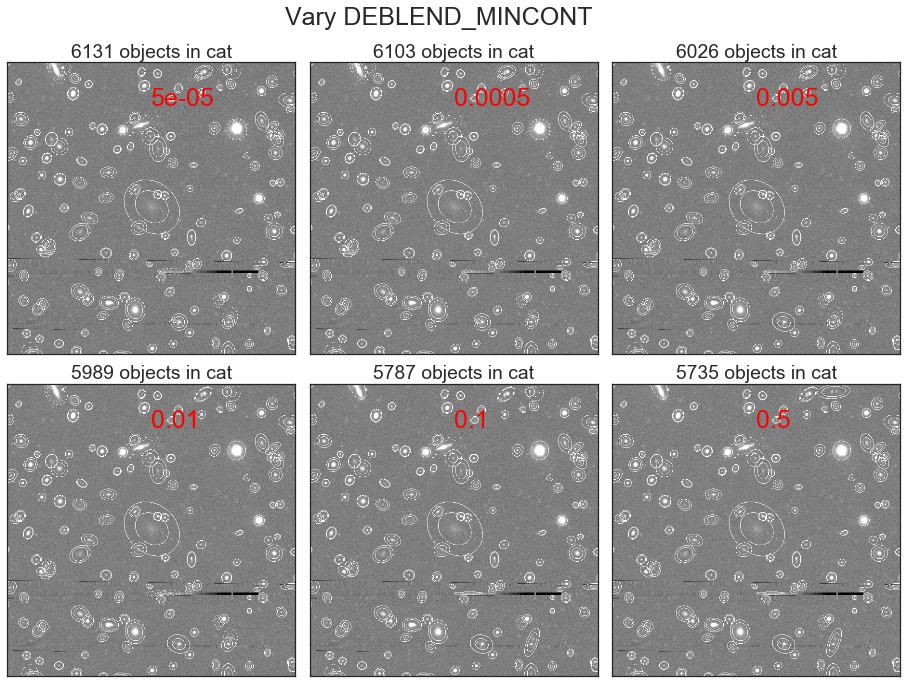

In [6]:
tract, patch = '16011', '7-1'
allfiles = os.listdir(datdir(tract, patch))
catfiles = filter(lambda f: 'cat' in f, allfiles)
apfiles = filter(lambda f: 'ap' in f, allfiles)
coord = (247.30972, 43.275164)
params = ['DETECT_THRESH', 'DETECT_MINAREA', 'DEBLEND_NTHRESH', 'DEBLEND_MINCONT']
for param in params:
    paramfiles, cats = get_files(apfiles, catfiles, param)
    make_images(paramfiles, tract, patch, coord, param, cats)